<a href="https://colab.research.google.com/github/edierf/pruebas/blob/main/RASTERIO_IMAGENES_SATELITALES.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

IMPORTAMOS LIBRERIAS

In [22]:
pip install rasterio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 49.7 MB/s eta 0:00:00


In [23]:
import rasterio


In [28]:
pip install matplotlib

In [29]:
import matplotlib.pyplot as plt

abrimos las imagen satelitales

In [30]:
IMAGEN_2024 = rasterio.open(r"/content/drive/MyDrive/IMAGENES_FUSA/20240123_152156_04_2477_3B_AnalyticMS_SR_clip.tif") # antes subimos la imagen a collab

IMAGEN_2024.count # cuantas bandas



4

In [31]:
IMAGEN_2017 = rasterio.open(r"/content/drive/MyDrive/IMAGENES_FUSA/20170716_144205_0e26_3B_AnalyticMS_SR_clip.tif") # antes subimos la imagen a collab

IMAGEN_2017.count # cuantas bandas


4

In [32]:
IMAGEN_2024.height # alto
IMAGEN_2017.height # alto



1924

In [33]:
IMAGEN_2024.width # ancho
IMAGEN_2017.width # ancho

2174

In [34]:
IMAGEN_2024.bounds # limites en caja

BoundingBox(left=570117.0, bottom=476505.0, right=576639.0, top=482277.0)

In [35]:
print(IMAGEN_2024.crs)
print(IMAGEN_2024.crs)

 # sistema de referencia

EPSG:32618
EPSG:32618


In [36]:
IMAGEN_2024.indexes # indices d elas bandas
print(IMAGEN_2017.indexes)

IMAGEN_2017.indexes # indices d elas bandas
print(IMAGEN_2024.indexes)


(1, 2, 3, 4)
(1, 2, 3, 4)


In [37]:
print(IMAGEN_2017.meta)
print(IMAGEN_2024.meta)


{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 2174, 'height': 1924, 'count': 4, 'crs': CRS.from_epsg(32618), 'transform': Affine(3.0, 0.0, 570117.0,
       0.0, -3.0, 482277.0)}
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 2174, 'height': 1924, 'count': 4, 'crs': CRS.from_epsg(32618), 'transform': Affine(3.0, 0.0, 570117.0,
       0.0, -3.0, 482277.0)}


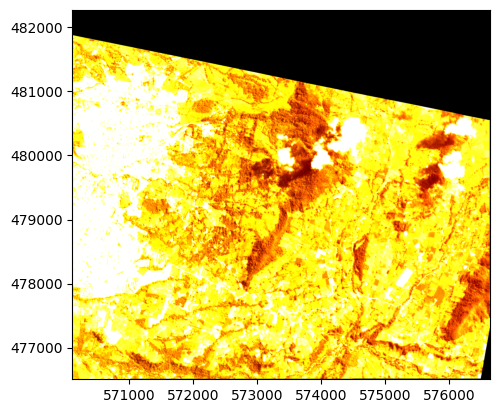

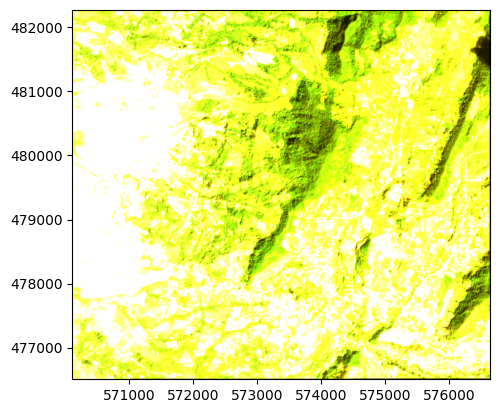

<Axes: >

In [38]:
from rasterio.plot import show # ploteamos la imagen
show (IMAGEN_2017)
show (IMAGEN_2024)


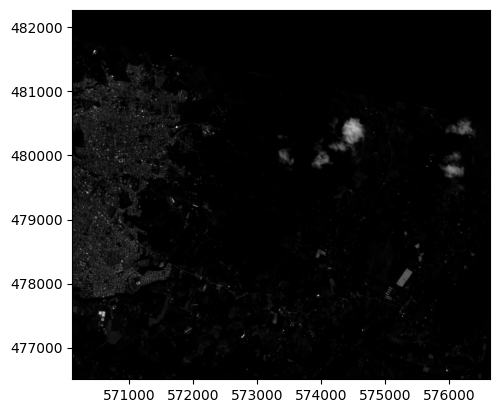

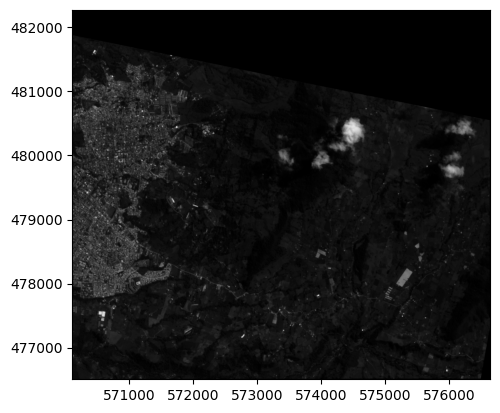

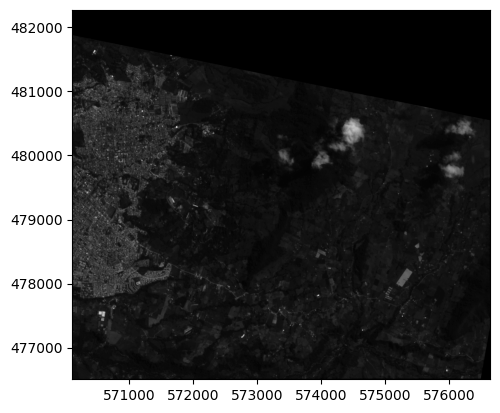

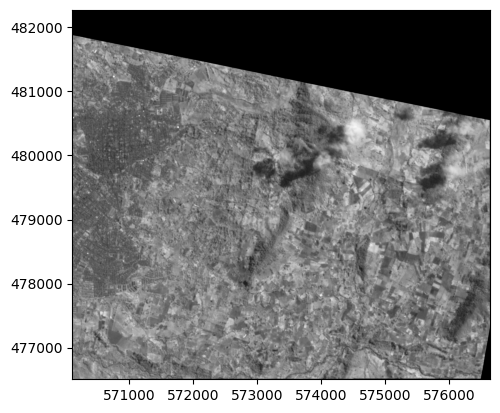

<Axes: >

In [39]:
show ((IMAGEN_2017,1), cmap='Greys_r') # con la b1 la pintamos
show ((IMAGEN_2017,2), cmap='Greys_r') # con la b2 la pintamos
show ((IMAGEN_2017,3), cmap='Greys_r') # con la b3 la pintamos
show ((IMAGEN_2017,4), cmap='Greys_r') # con la b4 la pintamos

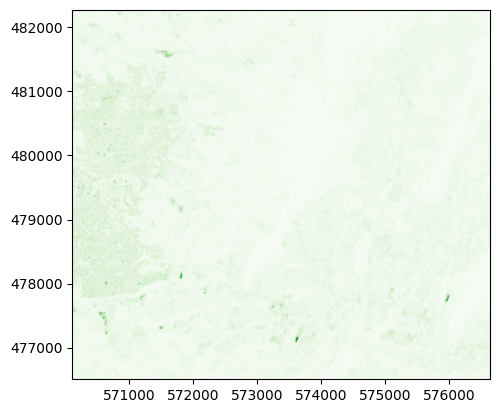

<Axes: >

In [40]:
show ((IMAGEN_2024,3), cmap = "Greens")

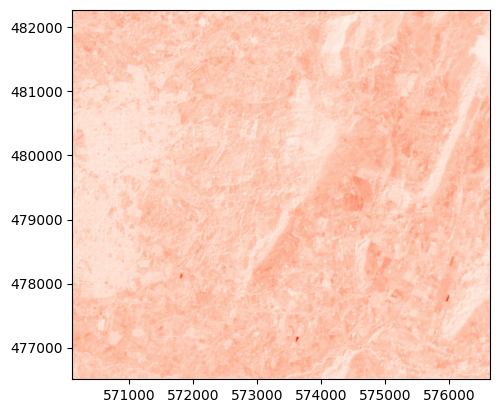

<Axes: >

In [41]:
show ((IMAGEN_2024,4), cmap = "Reds")

In [42]:
# guardamos las bandas en un array por separado de la imagen 2024

AZUL_2024 = IMAGEN_2024.read(1)
VERDE_2024 = IMAGEN_2024.read(2)
ROJO_2024 = IMAGEN_2024.read(3)
NIR_2024 = IMAGEN_2024.read(4)



In [43]:
# guardamos las bandas en un array por separado de la imagen 2017

AZUL_2017 = IMAGEN_2017.read(1)
VERDE_2017 = IMAGEN_2017.read(2)
ROJO_2017 = IMAGEN_2017.read(3)
NIR_2017 = IMAGEN_2017.read(4)

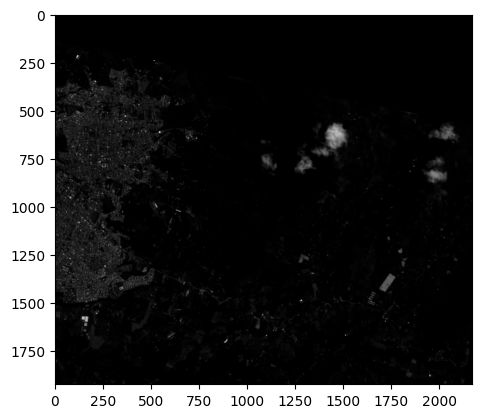

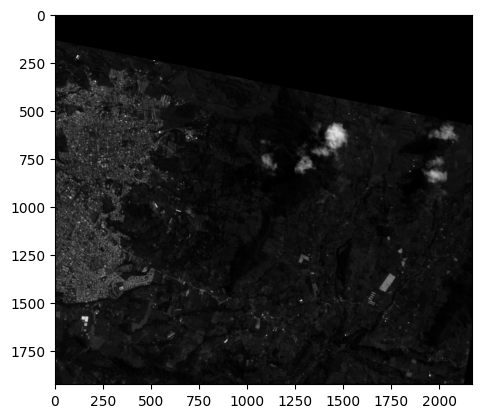

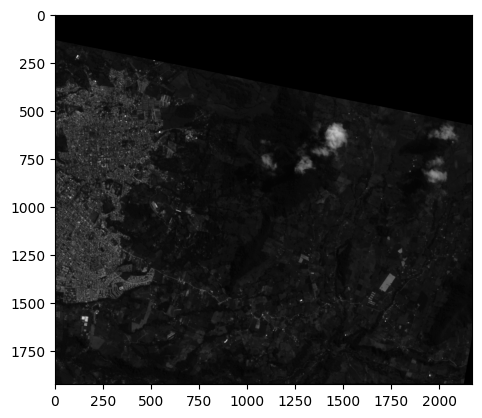

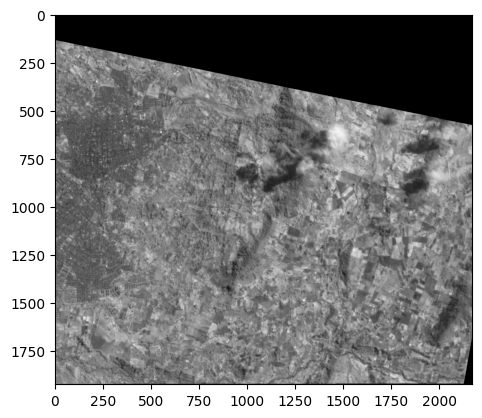

<Axes: >

In [44]:
show ((AZUL_2017), cmap='Greys_r') # leemos cada bandas a escala de grises
show ((VERDE_2017), cmap='Greys_r')
show ((ROJO_2017), cmap='Greys_r')
show ((NIR_2017), cmap='Greys_r')

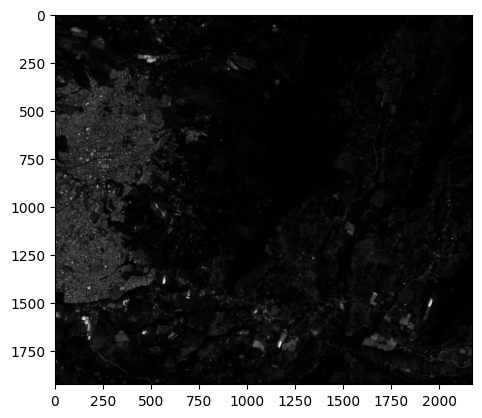

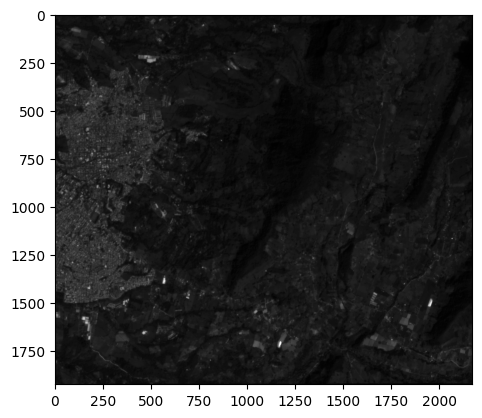

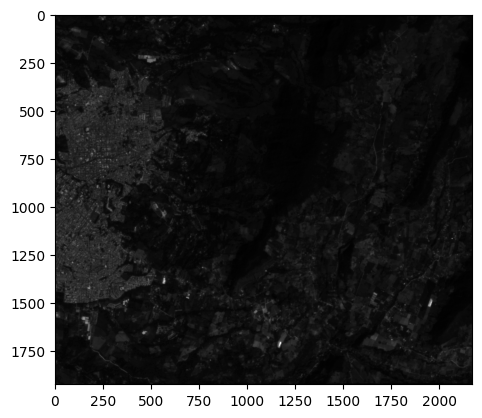

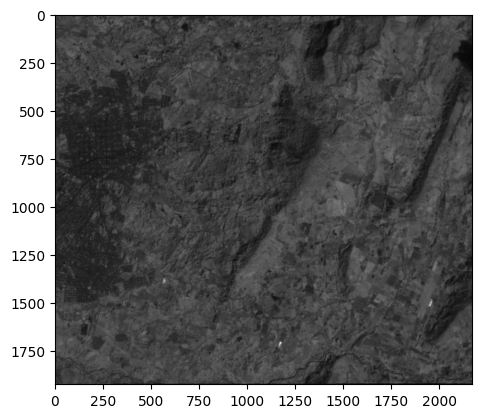

<Axes: >

In [45]:
show ((AZUL_2024), cmap='Greys_r') # leemos cada bandas a escala de grises
show ((VERDE_2024), cmap='Greys_r')
show ((ROJO_2024), cmap='Greys_r')
show ((NIR_2024), cmap='Greys_r')

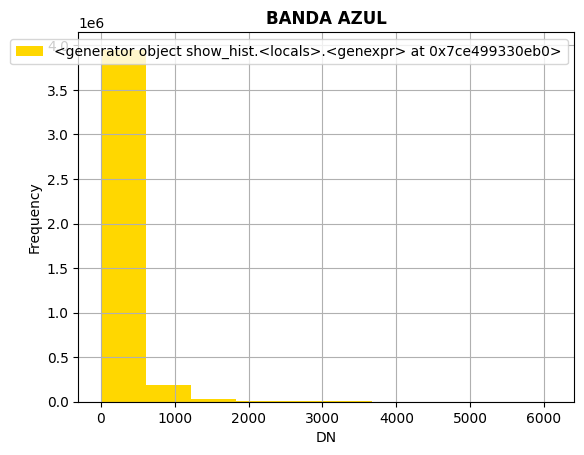

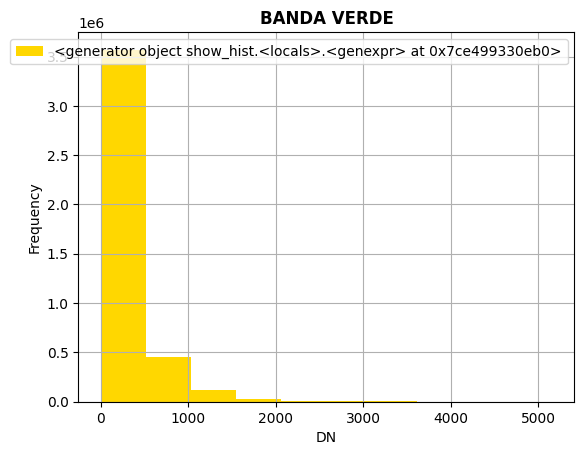

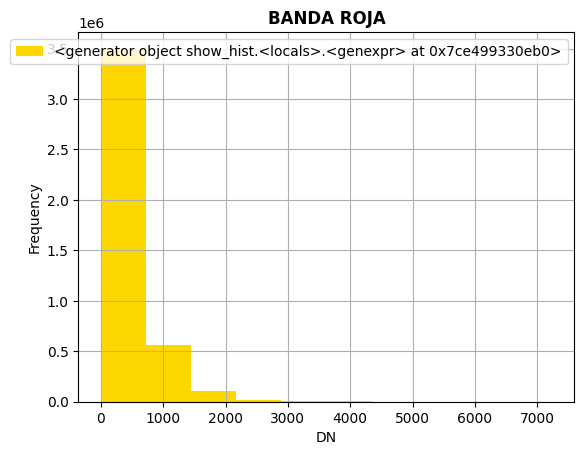

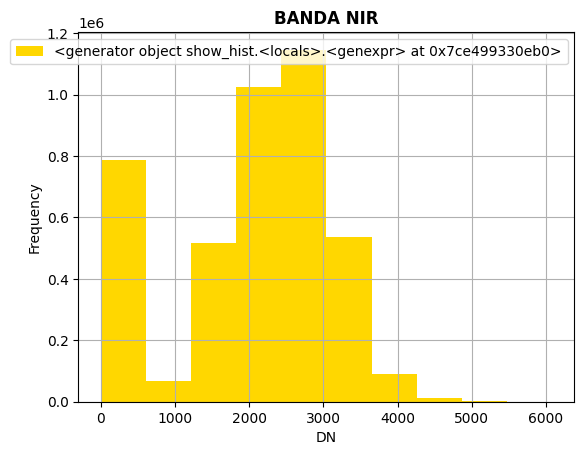

In [68]:
# creamos el histograma importamos el paquete
from rasterio.plot import show_hist

show_hist(AZUL_2017, title=("BANDA AZUL"))
show_hist(VERDE_2017, title=("BANDA VERDE"))
show_hist(ROJO_2017, title=("BANDA ROJA"))
show_hist(NIR_2017, title=("BANDA NIR"))



In [69]:
# IMPORTAMOS LIBRERIAS

import numpy as np
import matplotlib.pyplot as plt


float64


array([[[0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        ...,
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ]],

       [[0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        ...,
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ]],

       [[0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        ...,
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ]],

       ...,

       [[0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.0437171 , 0

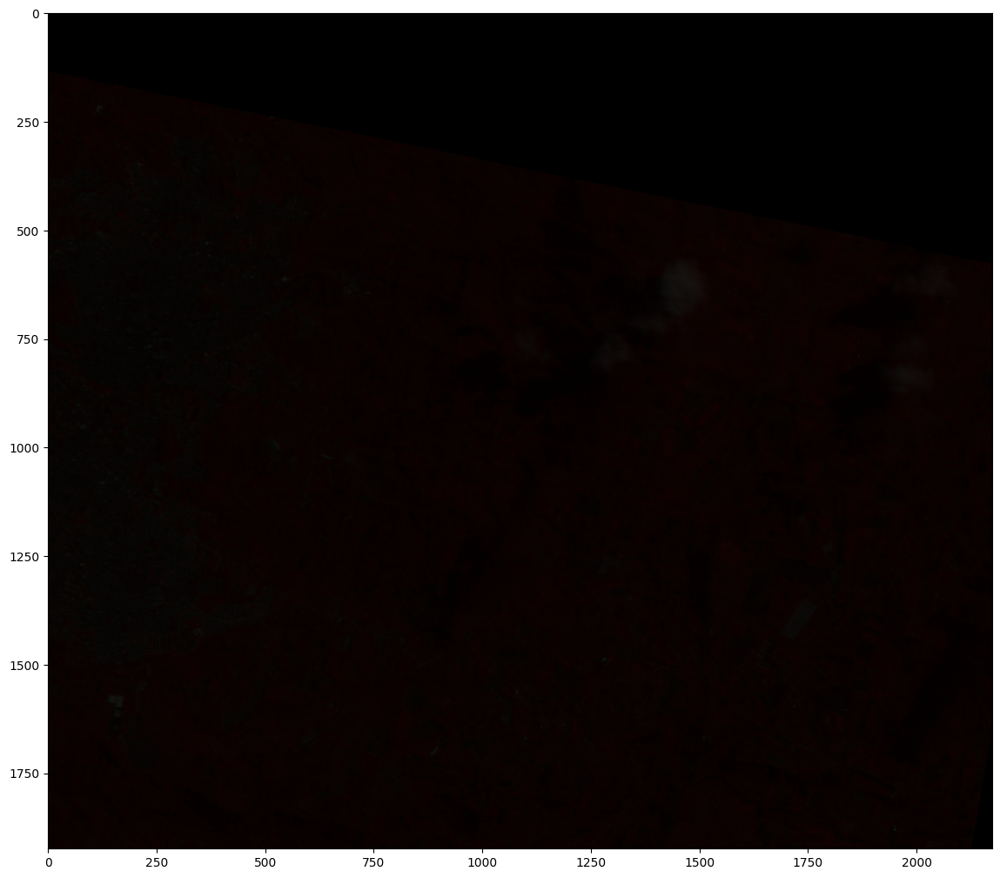

In [73]:
RD = 65535
COMPOSICION = np.dstack((NIR_2017/RD,ROJO_2017/RD,VERDE_2017/RD)) # realizo una composicion
print(COMPOSICION.dtype)

plt.subplots(figsize = (14,14)) # puedo ampliar el tamaño
plt.imshow(COMPOSICION) # muestro la imagen
COMPOSICION

Para crear indices debemos primero normaizar los datos de las bandas

In [74]:
print(COMPOSICION)

[[[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 ...

 [[0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.0437171  0.00553902 0.0034638 ]
  ...
  [0.         0.         0.        ]
  [0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]


In [52]:
# creamos indices 2017

RD = 65535
AZUL_NOR_2017 = IMAGEN_2017.read(1)/RD
VERDE_NOR_2017 = IMAGEN_2017.read(2)/RD
ROJO_NOR_2017 = IMAGEN_2017.read(3)/RD
NIR_NOR_2017 = IMAGEN_2017.read(4)/RD

NDVI_2017 = (NIR_NOR_2017-ROJO_NOR_2017)/(NIR_NOR_2017+ROJO_NOR_2017)

NDVI_2017.dtype



<ipython-input-52-22cf59722ecf>:9: RuntimeWarning: invalid value encountered in divide
  NDVI_2017 = (NIR_NOR_2017-ROJO_NOR_2017)/(NIR_NOR_2017+ROJO_NOR_2017)


dtype('float64')

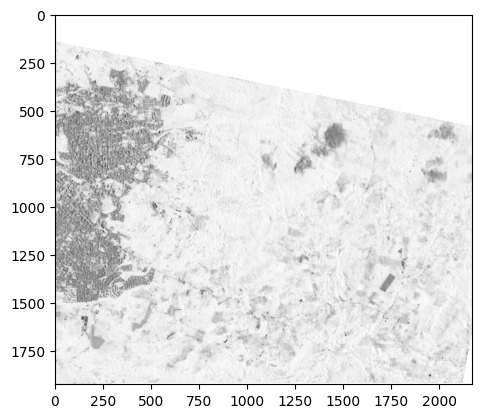

<Axes: >

In [53]:
show ((NDVI_2017), cmap='Greys_r') # VISUALIZO EL NDVI CON rasterio

In [55]:
# creamos indices 2024

RD = 65535
AZUL_NOR_2024 = IMAGEN_2024.read(1)/RD
VERDE_NOR_2024 = IMAGEN_2024.read(2)/RD
ROJO_NOR_2024 = IMAGEN_2024.read(3)/RD
NIR_NOR_2024 = IMAGEN_2024.read(4)/RD

NDVI_2024 = (NIR_NOR_2024-ROJO_NOR_2024)/(NIR_NOR_2024+ROJO_NOR_2024)

NDVI_2024.dtype

<ipython-input-55-db32a753c0c5>:9: RuntimeWarning: invalid value encountered in divide
  NDVI_2024 = (NIR_NOR_2024-ROJO_NOR_2024)/(NIR_NOR_2024+ROJO_NOR_2024)


dtype('float64')

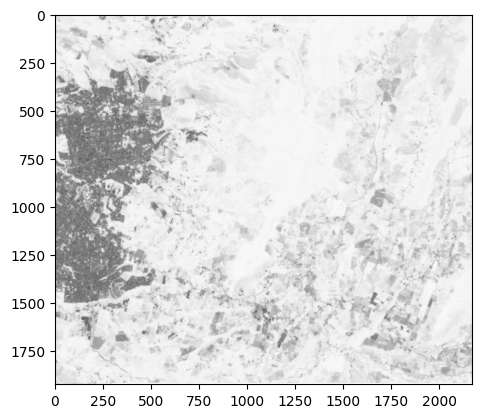

<Axes: >

In [56]:
show ((NDVI_2024), cmap='Greys_r') # VISUALIZO EL NDVI CON rasterio

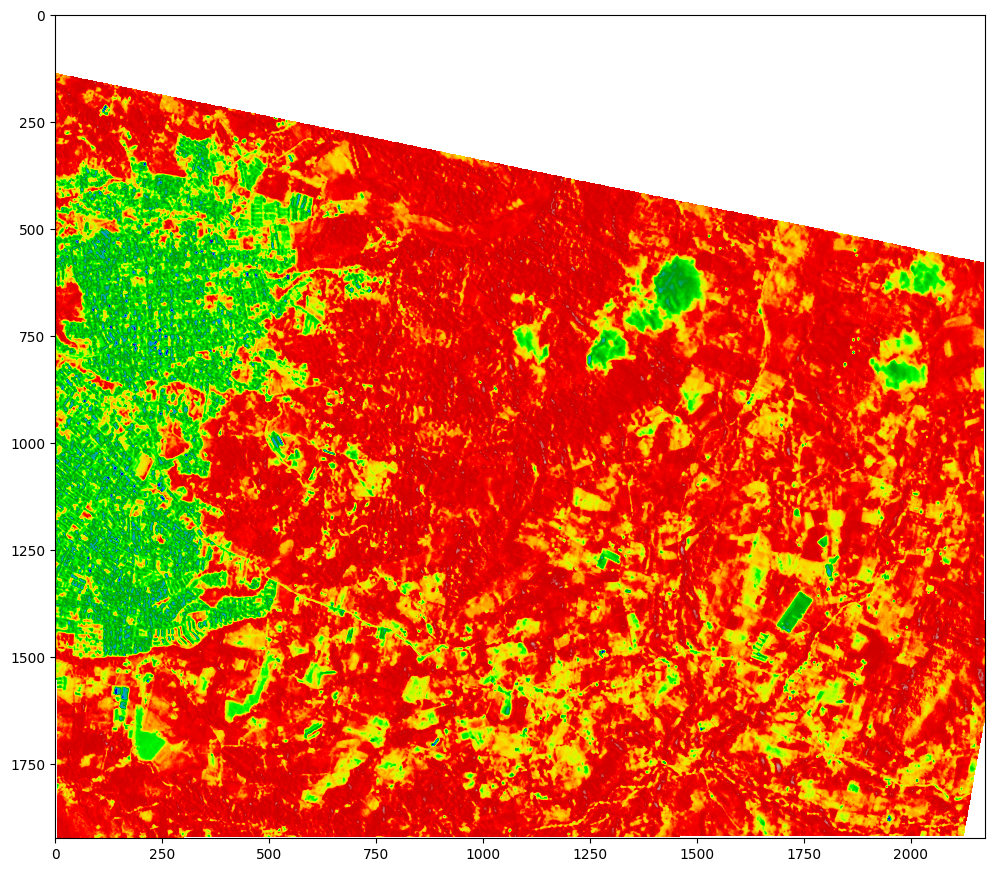

In [57]:
# ploteamos en plot con cmap 2017

plt.subplots(figsize = (12,12))
plt.imshow(NDVI_2017, cmap ='nipy_spectral')

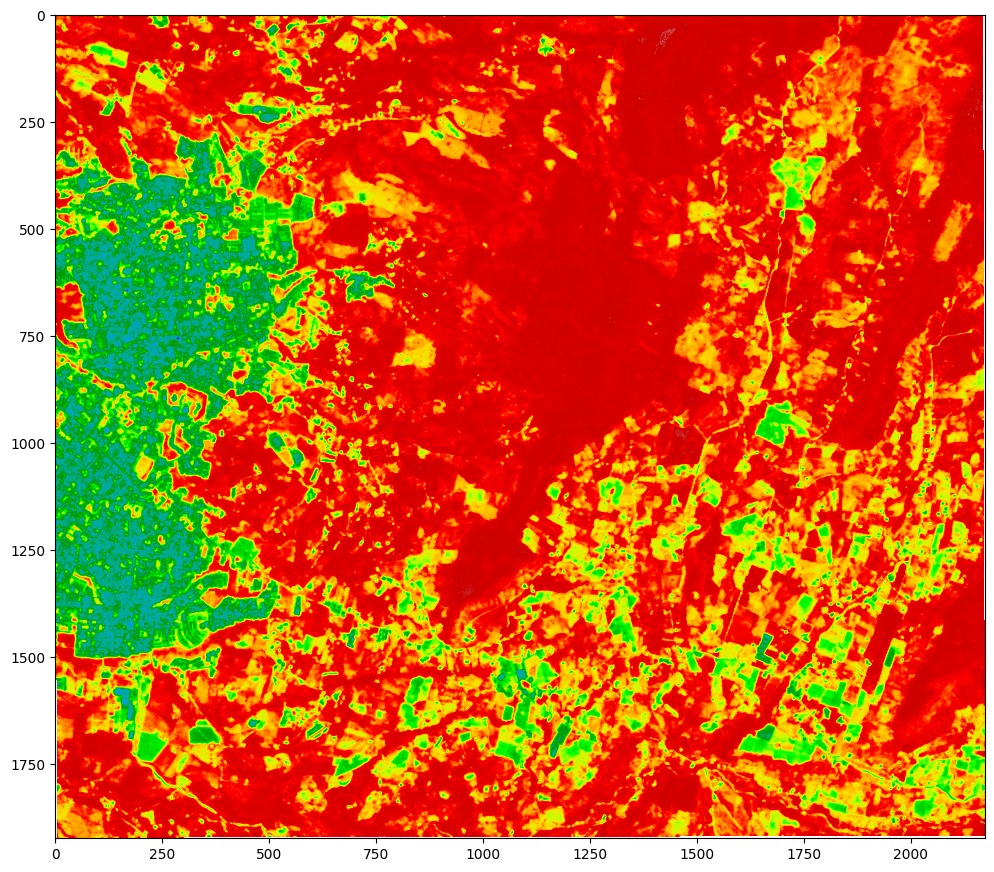

In [58]:
# ploteamos en plot con cmap 2024

plt.subplots(figsize = (12,12))
plt.imshow(NDVI_2024, cmap ='nipy_spectral')

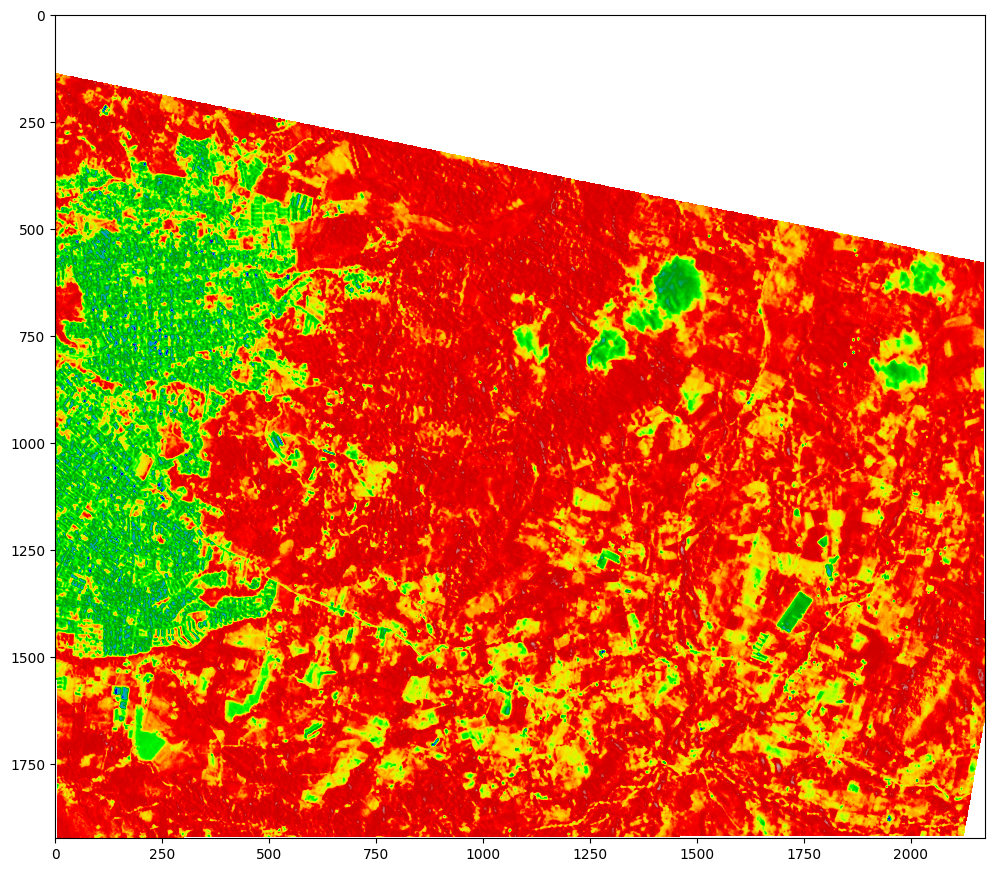

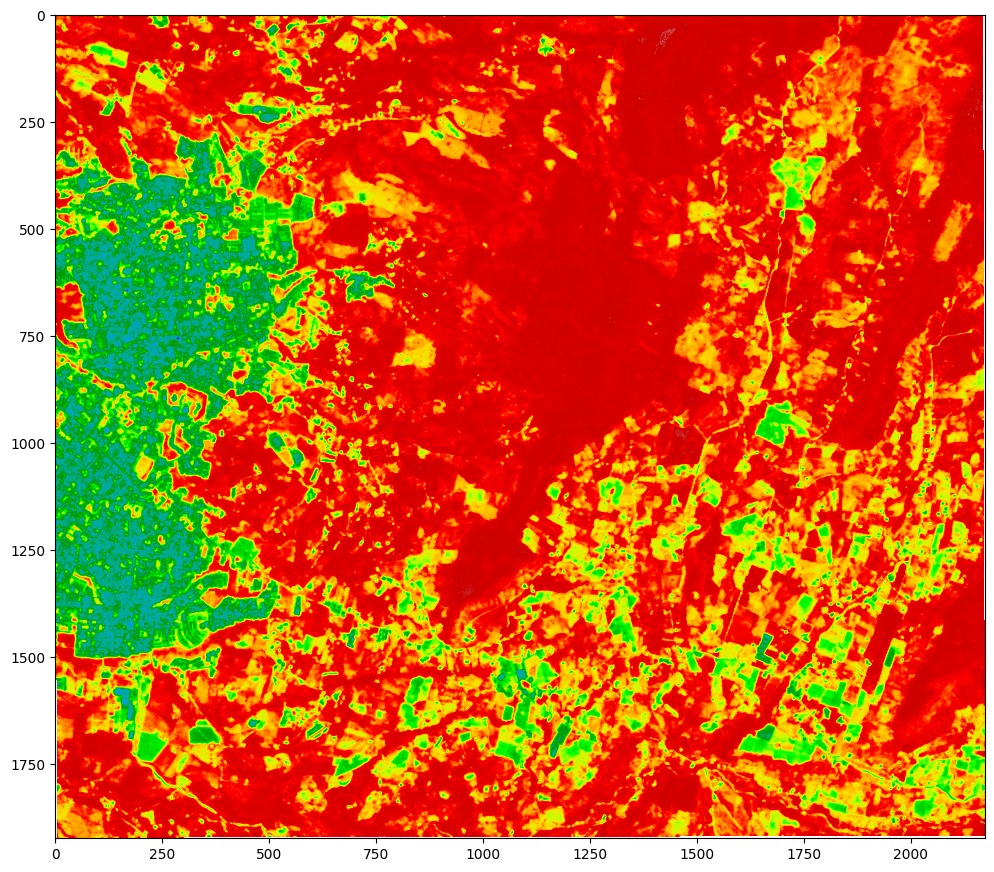

In [59]:
# ploteamos en plot con cmap

plt.subplots(figsize = (12,12))
plt.imshow(NDVI_2017, cmap ='nipy_spectral')

plt.subplots(figsize = (12,12))
plt.imshow(NDVI_2024, cmap ='nipy_spectral')

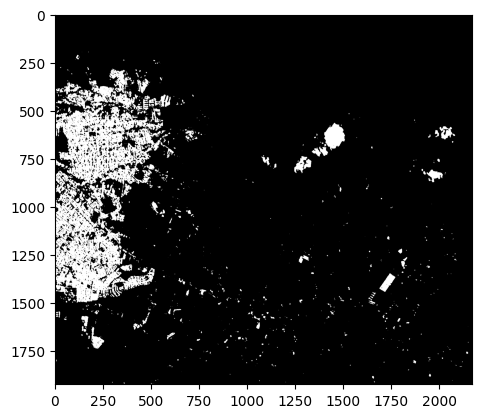

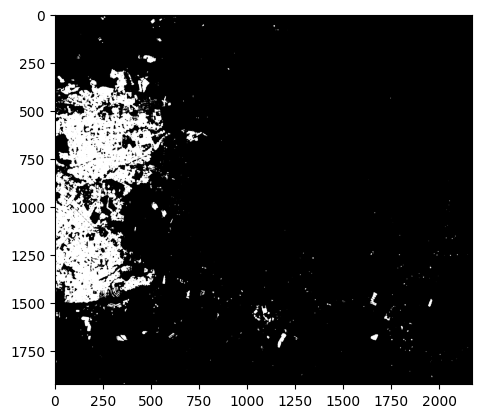

bool
bool


In [62]:

NDVI_ALTO_2017 = NDVI_2017 < 0.3 # NDVI ALTO
show ((NDVI_ALTO_2017), cmap='Greys_r') # VISUALIZO EL NDVI CON rasterio

NDVI_ALTO_2024 = NDVI_2024 < 0.3 # NDVI ALTO
show ((NDVI_ALTO_2024), cmap='Greys_r') # VISUALIZO EL NDVI CON rasterio

print(NDVI_ALTO_2017.dtype)
print(NDVI_ALTO_2024.dtype)





In [63]:
# DRIVER, HEIGTH, WITH, COUNT, DTYPE, CRC, TRANSF

from rasterio.crs import CRS

#driver = "GTiff"
#height = IMAGEN.height
#width = IMAGEN.width
#count = 1
#dtype = NDVICAMBIADO.dtype
#crs = IMAGEN.crs
#transform = NDVI.transform


with rasterio.open('NADVI_ALTO2024.tif', 'w',
                   driver = "GTiff",
                   height = IMAGEN_2017.height,
                   width = IMAGEN_2017.width,
                   count = 1,
                   dtype = NDVI_2017.dtype,
                   crs = CRS.from_epsg(32618),
                   transform = IMAGEN_2017.transform) as dst:

      dst.write(NDVI_ALTO_2024.astype(NDVI_2017.dtype),1)



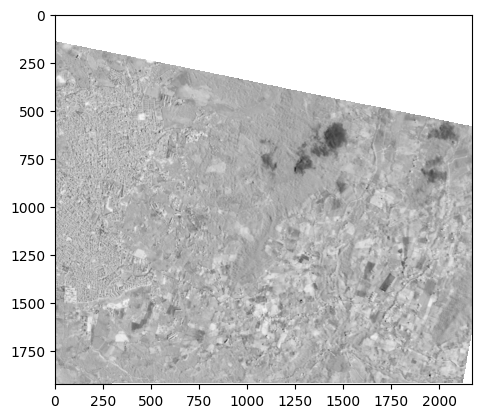

<Axes: >

In [67]:
NDVI_2024.dtype

RESTA = NDVI_2017-NDVI_2024

show ((RESTA), cmap='Greys_r') # VISUALIZO EL NDVI CON rasterio
